In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Importing the necessary libraries

In [ ]:
#Importing the required libraries
import pandas as pd
import os
import datetime
import warnings
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff
import networkx as nx
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer



The Below code is to ignore all the warning messages.

In [ ]:
warnings.filterwarnings("ignore")

#Data Cleaning

Cleaning the files "unclean cclass.csv" and "unclean focus.csv" means filling in missing values from other related columns, removing unnecessary columns, and saving the cleaned data back to the original files.

In [ ]:
# prompt: I want to know how many rows and how many columns in each file with the columns names "/content/drive/MyDrive/Colab Notebooks/Dissertation/Car Data by Make/Car Data by Make/"

for file in os.listdir("/content/drive/MyDrive/Colab Notebooks/dissertation/Car Data by Make"):
  if file.endswith(".csv"):
    df = pd.read_csv(os.path.join("/content/drive/MyDrive/Colab Notebooks/dissertation/Car Data by Make", file))
    print(f"File: {file}")
    print(f"Number of rows: {df.shape[0]}")
    print(f"Number of columns: {df.shape[1]}")
    print(f"Column names: {df.columns.tolist()}")
    print("-" * 30)


File: hyundi.csv
Number of rows: 4860
Number of columns: 9
Column names: ['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'tax(£)', 'mpg', 'engineSize']
------------------------------
File: unclean focus.csv
Number of rows: 5604
Number of columns: 11
Column names: ['model', 'year', 'price', 'transmission', 'mileage', 'fuel type', 'engine size', 'mileage2', 'fuel type2', 'engine size2', 'reference']
------------------------------
File: vauxhall.csv
Number of rows: 13632
Number of columns: 9
Column names: ['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'tax', 'mpg', 'engineSize']
------------------------------
File: ford.csv
Number of rows: 17965
Number of columns: 9
Column names: ['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'tax', 'mpg', 'engineSize']
------------------------------
File: unclean cclass.csv
Number of rows: 4006
Number of columns: 11
Column names: ['model', 'year', 'price', 'transmission', 'mileage', 'fuel type', 'en

Based on the above result,

Tables having  Columns:9

1. VW.CSV : 5157,
2. Vaxhall.CSV : 13632,
3. toyota.CSV : 6738
4. Skoda.CSV : 6267
5. merc.CSV : 13119
6. hyundi.CSV : 4860
7. ford.CSV : 17965
8. bmw.CSV : 10781
9. audi.CSV : 10668  

Tables having  Columns: 7
1. cclass.CSV : 3899
2. focus.CSV : 5454

Tables having Columns:11
1. unclean cclass.CSV : 4006
2. unclean focus.CSV : 5604

In [ ]:
def clean_car_data(file_path):
    #Load the dataset using pandas
    data = pd.read_csv(file_path)

    #Filling the missing values in "mileage" with "mileage2"
    data["mileage"] = data["mileage"].fillna(data["mileage2"])

    #Filling the missing values in "fuel type" with "fuel type2"
    data["fuel type"] = data['fuel type'].fillna(data["fuel type2"])

    #Filling the missing values in "engine size" with "engine size2"
    data["engine size"] = data["engine size"].fillna(data["engine size2"])



    #Dropping the columns "mileage2", "engine size2", "fuel type2"
    data = data.drop(columns=["mileage2","engine size2","fuel type2"])

    #Renaming the columns which we have removed
    data = data.rename(columns={"fuel type": "fuelType", "engine size":"engineSize"})


    #Dropping missing values in all columns
    data = data.dropna()

    #Save the cleaned data into the same CSV file
    data.to_csv(file_path, index=False)
    print(f'Changes have been saves to {file_path}')

In [ ]:
#List of file paths to process
file_paths = [r"/content/drive/MyDrive/Colab Notebooks/dissertation/Car Data by Make/unclean cclass.csv",
              r"/content/drive/MyDrive/Colab Notebooks/dissertation/Car Data by Make/unclean focus.csv"]

# Apply the cleaning function to each file
for file_path in file_paths:
    clean_car_data(file_path)

Changes have been saves to /content/drive/MyDrive/Colab Notebooks/dissertation/Car Data by Make/unclean cclass.csv
Changes have been saves to /content/drive/MyDrive/Colab Notebooks/dissertation/Car Data by Make/unclean focus.csv


Based on the previous cell, I have cleaned these two files:
1. unclean cclass.csv

2. unclean focus.csv

In [ ]:
#The Directory which contains the CSV files
input_directory = "/content/drive/MyDrive/Colab Notebooks/dissertation/Car Data by Make"
output_directory = "/content/drive/MyDrive/Colab Notebooks/dissertation/CarData"
os.makedirs(output_directory, exist_ok=True)
#os.makedirs:This function creates a directory specified by output_directory variable name.

In [ ]:
#Go through each file in the folder in the directory
for filename in os.listdir(input_directory):
  if filename.endswith(".csv"):
    input_filepath = os.path.join(input_directory, filename)

    #Get the brand name from the filename (e.g., filenames like 'audi.csv', 'bmw.csv', etc.)
    brand = filename.split(".")[0].capitalize()
    df = pd.read_csv(input_filepath, dtype=str,low_memory=False)
    #input_filepath:This is the path to the CSV file you want to read.
    #dtype=str:This argument tells pandas to treat all the data in the CSV file as strings (text).
    #low_memory=False:This argument tells pandas to not use a mode that saves memory but is slower. Setting it to False can make the reading process faster but might use more memory.

    #Adding the brand column
    df["brand"] = brand

    #Save the updated data to a new file in the output folder
    output_filepath = os.path.join(output_directory, filename)
    df.to_csv(output_filepath, index=False)
print("Brand column added to each CSV file and saved to the new directory")

Brand column added to each CSV file and saved to the new directory


In [ ]:
#Directory which contains the CSV file
folder_path = "/content/drive/MyDrive/Colab Notebooks/dissertation/CarData"

#Initializing an empty DataFrame to store all data
merged_path = pd.DataFrame()

#Lisiting all the files in the directory
file_list = os.listdir(folder_path)

In [ ]:
#prints all the list of files present in the directory
file_list

['hyundi.csv',
 'unclean focus.csv',
 'vauxhall.csv',
 'ford.csv',
 'unclean cclass.csv',
 'bmw.csv',
 'merc.csv',
 'toyota.csv',
 'cclass.csv',
 'focus.csv',
 'skoda.csv',
 'audi.csv',
 'vw.csv']

In [ ]:
#Initializing a list to store DataFrames
dataframes = []
file_list = os.listdir(folder_path)
#os.listdir(folder_path):This function from the os module gets the names of all files and folders inside the folder specified by folder_path
for file in file_list:
  #Checks whether all the files are in ".csv" format
  if file.endswith(".csv"):
    file_path = os.path.join(folder_path, file)
    #os.path.join: This function is used to combine parts of a file path.
    #folder_path: This is the path to the folder.
    #file: This is the name of the file.
    df = pd.read_csv(file_path) #This reads reads the CSV by using the file_path as shown above
    dataframes.append(df) #We then append the "df" into the "dataframe"
merged_data = pd.concat(dataframes, ignore_index=True)
#pd.concat:This function is used to concatenate (combine) DataFrames.
#dataframes: This is a list of the DataFrames you want to combine.
#ignore_index=True: This tells pandas to reindex the combined DataFrame, ignoring the original index values.
merged_data.head()

,model,year,price,transmission,mileage,fuelType,tax(£),mpg,engineSize,brand,reference,tax
0,I20,2017.0,7999,Manual,17307,Petrol,145.0,58.9,1.2,Hyundi,NaN,NaN
1,Tucson,2016.0,14499,Automatic,25233,Diesel,235.0,43.5,2.0,Hyundi,NaN,NaN
2,Tucson,2016.0,11399,Manual,37877,Diesel,30.0,61.7,1.7,Hyundi,NaN,NaN
3,I10,2016.0,6499,Manual,23789,Petrol,20.0,60.1,1.0,Hyundi,NaN,NaN
4,IX35,2015.0,10199,Manual,33177,Diesel,160.0,51.4,2.0,Hyundi,NaN,NaN


In [ ]:
#Output the merged data into a new CSV file
output_file = "/content/drive/MyDrive/Colab Notebooks/dissertation/merged_data_cars_transformed.csv"
merged_data.to_csv(output_file, index=False)
print(f"Merged data saved to {output_file}")

Merged data saved to /content/drive/MyDrive/Colab Notebooks/dissertation/merged_data_cars_transformed.csv


#Transforming and Cleaning Merged Data


In [ ]:
#Load the combined data from the saved CSV file
merged_data_new = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/dissertation/merged_data_cars_transformed.csv")

In [ ]:
#Filling the missing 'tax' values with 'tax(£)' values
merged_data_new['tax'] = merged_data_new['tax'].fillna(merged_data_new['tax(£)'])

#Dropping the "tax(£)" values
merged_data_new.drop(['tax(£)'], axis=1, inplace=True)

In [ ]:
#We Select the required columns of interest
columns_of_interest = ["model", "year", "price", "transmission", "mileage", "fuelType", "tax", "mpg", "engineSize","brand"]
merged_data = merged_data[columns_of_interest]

#Save the updated dataframe into a CSV file
merged_data.to_csv("/content/drive/MyDrive/Colab Notebooks/dissertation/merged_data_cars_transformed.csv", index=False)
print("Data transformation complete and saved.")

Data transformation complete and saved.


In [ ]:
# prompt: I want to remove unclean from brand column name in this file and save it again in the same file "/content/drive/MyDrive/Colab Notebooks/Dissertation/merged_data_cars_transformed.csv"

# Load the data
merged_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/dissertation/merged_data_cars_transformed.csv")

# Replace "unclean " in the "brand" column
merged_data['brand'] = merged_data['brand'].str.replace('Unclean ', '')

# Save the updated dataframe back to the same file
merged_data.to_csv("/content/drive/MyDrive/Colab Notebooks/dissertation/merged_data_cars_transformed.csv", index=False)
print("Brand column names updated and saved.")


Brand column names updated and saved.


In [ ]:
#Loading the changed data from a specific CSV file into a pandas DataFrame.
data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/dissertation/merged_data_cars_transformed.csv")

In [ ]:
data.head()

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,I20,2017.0,7999,Manual,17307,Petrol,NaN,58.9,1.2,Hyundi
1,Tucson,2016.0,14499,Automatic,25233,Diesel,NaN,43.5,2.0,Hyundi
2,Tucson,2016.0,11399,Manual,37877,Diesel,NaN,61.7,1.7,Hyundi
3,I10,2016.0,6499,Manual,23789,Petrol,NaN,60.1,1.0,Hyundi
4,IX35,2015.0,10199,Manual,33177,Diesel,NaN,51.4,2.0,Hyundi


In [ ]:
# Replace 'cclass' with 'Cclass' and 'focus' with 'Focus' in the 'brand' column
data['brand'] = data['brand'].str.replace('cclass', 'Cclass')
data['brand'] = data['brand'].str.replace('focus', 'Focus')

In [ ]:
#Printing the shape of the "data"
print("\nShape of the data (rows, columns):")
data.shape


Shape of the data (rows, columns):


(117903, 10)

In [ ]:
#Printing the column of the "data"
print("\nColumn names:")
data.columns


Column names:


Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'tax',
       'mpg', 'engineSize', 'brand'],
      dtype='object')

In [ ]:
#Printng the Summary of the data
print("\nSummary of the data:")
data.info()


Summary of the data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117903 entries, 0 to 117902
Data columns (total 10 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   model         117903 non-null  object 
 1   year          117903 non-null  float64
 2   price         117903 non-null  object 
 3   transmission  117903 non-null  object 
 4   mileage       117903 non-null  object 
 5   fuelType      117903 non-null  object 
 6   tax           94327 non-null   float64
 7   mpg           99187 non-null   float64
 8   engineSize    117903 non-null  object 
 9   brand         117903 non-null  object 
dtypes: float64(3), object(7)
memory usage: 9.0+ MB


In [ ]:
#Printing the Statistical summary of numerical columns
print("\nStatistical summary of numerical columns:")
data.describe()


Statistical summary of numerical columns:


,year,tax,mpg
count,117903.000000,94327.000000,99187.000000
mean,2017.106452,120.256183,55.166825
std,2.135852,63.404805,16.138522
min,1970.000000,0.000000,0.300000
25%,2016.000000,125.000000,47.100000
50%,2017.000000,145.000000,54.300000
75%,2019.000000,145.000000,62.800000
max,2060.000000,580.000000,470.800000


Year: The maximum year of 2060 is an outlier and likely an error, as it is beyond the current year.

Tax: The minimum tax value of £0 and the maximum of £580 suggest potential outliers.

MPG: Values like 0.3 and 470.8 MPG are outliers, as they fall outside the realistic range for vehicle fuel efficiency.

while model building will deal with outliers

In [ ]:
data[data.year>2024]

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
41677,Fiesta,2060.0,6495,Automatic,54807,Petrol,205.0,42.8,1.4,Ford


In [ ]:
#above record is invalid since it is more than current year(2024),
#Data with manufacturing year more than current year(2024) removed
data=data.query('year<=2024')


In [ ]:
#We are creating a box plot using plotly.express to plot a graph between 'tax' V/S 'mpg'
import plotly.express as px

data_melted = data.melt(value_vars=['tax', 'mpg'], var_name='Variable', value_name='Value')
fig = px.box(data_melted, x="Variable", y="Value",
             title="To detect Outliers, Box Plot of Tax, MPG",
             labels={"Variable": "Feature", "Value": "Value"},
             color="Variable",
             color_discrete_map={'tax': 'blue', 'mpg':'green'})

fig.show()

In [ ]:
#Provides the Unique values for all the columns
for column in data.columns:
    print(f"\nUnique values in column '{column}':")
    print(data[column].unique())


Unique values in column 'model':
[' I20' ' Tucson' ' I10' ' IX35' ' I30' ' I40' ' Ioniq' ' Kona'
 ' Veloster' ' I800' ' IX20' ' Santa Fe' ' Accent' ' Terracan' ' Getz'
 ' Amica' ' Focus' ' Corsa' ' Astra' ' Viva' ' Mokka' ' Mokka X'
 ' Crossland X' ' Zafira' ' Meriva' ' Zafira Tourer' ' Adam'
 ' Grandland X' ' Antara' ' Insignia' ' Ampera' ' GTC' ' Combo Life'
 ' Vivaro' ' Cascada' ' Kadjar' ' Agila' ' Tigra' ' Vectra' ' Fiesta'
 ' Puma' ' Kuga' ' EcoSport' ' C-MAX' ' Mondeo' ' Ka+' ' Tourneo Custom'
 ' S-MAX' ' B-MAX' ' Edge' ' Tourneo Connect' ' Grand C-MAX' ' KA'
 ' Galaxy' ' Mustang' ' Grand Tourneo Connect' ' Fusion' ' Ranger'
 ' Streetka' ' Escort' ' Transit Tourneo' ' C Class' ' 5 Series'
 ' 6 Series' ' 1 Series' ' 7 Series' ' 2 Series' ' 4 Series' ' X3'
 ' 3 Series' ' X5' ' X4' ' i3' ' X1' ' M4' ' X2' ' X6' ' 8 Series' ' Z4'
 ' X7' ' M5' ' i8' ' M2' ' M3' ' M6' ' Z3' ' SLK' ' S Class' ' SL CLASS'
 ' G Class' ' GLE Class' ' GLA Class' ' A Class' ' B Class' ' GLC Class'
 ' E Cla

In [ ]:
#Checking whether if there is any NaN Values
data.isna().sum()

,0
model,0
year,0
price,0
transmission,0
mileage,0
fuelType,0
tax,23576
mpg,18716
engineSize,0
brand,0


In [ ]:
#Removing all the "CC","£","Unknown","0".
data['engineSize'] = data['engineSize'].replace({'Â£': '', 'cc': '', 'CC': '', ',': '.'}, regex=True).str.strip()
data['engineSize'] = data['engineSize'].replace({'Unknown': '0'})
data['engineSize'] = data['engineSize'].str.extract('(\d+\.?\d*)', expand=False)
data['engineSize'] = pd.to_numeric(data['engineSize'], errors= 'ignore')

In [ ]:
# Clean the 'price' column by removing non-numeric characters
data['price'] = data['price'].replace({'[£,]': ''}, regex=True).astype(float)

# Replace 'Unknown' in 'mileage' with 0 and remove commas
data['mileage'] = data['mileage'].replace({'Unknown': '0', ',': ''}, regex=True).astype(float)

In [ ]:
data=data.query('(mileage!=0) and (mileage!=0)')

In [ ]:
# Define the valid fuel types
valid_fuel_types = ['Petrol', 'Diesel', 'Other', 'Electric', 'Hybrid']

# Filter the DataFrame to keep only rows with valid fuel types
data = data[data['fuelType'].isin(valid_fuel_types)]

# Display the unique values in the filtered DataFrame
print(data['fuelType'].unique())

['Petrol' 'Diesel' 'Hybrid' 'Other' 'Electric']


In [ ]:
#Finding the unique values of 'engineSize'
data['engineSize'].unique()

array([1.200e+00, 2.000e+00, 1.700e+00, 1.000e+00, 1.400e+00, 1.600e+00,
       0.000e+00, 2.500e+00, 2.200e+00, 1.300e+00, 2.900e+00, 1.100e+00,
       2.400e+00, 9.990e-01, 1.498e+00, 1.560e+00, 9.990e+02, 1.000e+03,
       2.300e+03, 1.498e+03, 1.500e+00, 1.450e+02, 2.000e+01, 1.500e+02,
       3.000e+01, 2.300e+00, 1.600e+02, 1.250e+02, 2.350e+02, 2.000e+02,
       2.400e+02, 2.050e+02, 1.200e+02, 1.400e+02, 1.596e+03, 1.499e+03,
       3.000e+02, 1.999e+03, 1.560e+03, 1.650e+02, 2.650e+02, 1.800e+00,
       1.900e+00, 2.800e+00, 3.200e+00, 5.000e+00, 3.000e+00, 3.050e+02,
       2.100e+00, 2.143e+03, 3.982e+03, 2.600e+02, 5.700e+02, 3.250e+02,
       1.350e+02, 2.996e+03, 1.595e+03, 1.950e+03, 1.497e+03, 1.597e+03,
       1.600e+03, 1.850e+02, 1.991e+03, 2.143e+00, 2.000e+03, 3.000e+03,
       3.200e+03, 5.400e+03, 2.148e+03, 2.100e+03, 1.500e+03, 6.000e-01,
       4.400e+00, 4.000e+00, 6.600e+00, 3.500e+00, 5.500e+00, 6.200e+00,
       4.700e+00, 6.000e+00,       nan])

In [ ]:
#Checking if there is any NaN Values
data['engineSize'].isna().sum()

52367

In [ ]:
data.isna().sum()

,0
model,0
year,0
price,0
transmission,0
mileage,0
fuelType,0
tax,20995
mpg,16135
engineSize,52367
brand,0


In [ ]:
# prompt: In the dataframe data there are null values what is the best way to fill those?

# Filling missing values in 'tax' with the median
data['tax'] = data['tax'].fillna(data['tax'].median())

# Filling missing values in 'mpg' with the median
data['mpg'] = data['mpg'].fillna(data['mpg'].median())

# Filling missing values in 'engineSize' with the median
data['engineSize'] = data['engineSize'].fillna(data['engineSize'].median())

# Checking if there are any remaining NaN values
print(data.isna().sum())


model           0
year            0
price           0
transmission    0
mileage         0
fuelType        0
tax             0
mpg             0
engineSize      0
brand           0
dtype: int64


In [ ]:
#Finding the mean of 'tax','mpg' and 'engineSize'
data['tax'] = data['tax'].fillna(data['tax'].mean())
data['mpg'] = data['mpg'].fillna(data['mpg'].mean())
data['engineSize'] = data['engineSize'].fillna(data['engineSize'].mean())
#Remove entries which have engineSize equal to 0 which is invalid since these car are not electic cars
data=data.query('(engineSize!=0) and (engineSize!=0 or fuelType=="Electric")')
display(data)

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand
0,I20,2017.0,7999.0,Manual,17307.0,Petrol,145.0,58.9,1.2,Hyundi
1,Tucson,2016.0,14499.0,Automatic,25233.0,Diesel,145.0,43.5,2.0,Hyundi
2,Tucson,2016.0,11399.0,Manual,37877.0,Diesel,145.0,61.7,1.7,Hyundi
3,I10,2016.0,6499.0,Manual,23789.0,Petrol,145.0,60.1,1.0,Hyundi
4,IX35,2015.0,10199.0,Manual,33177.0,Diesel,145.0,51.4,2.0,Hyundi
...,...,...,...,...,...,...,...,...,...,...
117898,Eos,2012.0,5990.0,Manual,74000.0,Diesel,125.0,58.9,1.6,Vw
117899,Fox,2008.0,1799.0,Manual,88102.0,Petrol,145.0,46.3,1.6,Vw
117900,Fox,2009.0,1590.0,Manual,70000.0,Petrol,200.0,42.0,1.6,Vw
117901,Fox,2006.0,1250.0,Manual,82704.0,Petrol,150.0,46.3,1.6,Vw


In [ ]:
import datetime

In [ ]:
current_year = datetime.datetime.now().year
data['carAge'] = current_year - data['year']

data.head()

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand,carAge
0,I20,2017.0,7999.0,Manual,17307.0,Petrol,145.0,58.9,1.2,Hyundi,7.0
1,Tucson,2016.0,14499.0,Automatic,25233.0,Diesel,145.0,43.5,2.0,Hyundi,8.0
2,Tucson,2016.0,11399.0,Manual,37877.0,Diesel,145.0,61.7,1.7,Hyundi,8.0
3,I10,2016.0,6499.0,Manual,23789.0,Petrol,145.0,60.1,1.0,Hyundi,8.0
4,IX35,2015.0,10199.0,Manual,33177.0,Diesel,145.0,51.4,2.0,Hyundi,9.0


In [ ]:
# Convert the 'year' column to integer
data['year'] = data['year'].astype(int)


In [ ]:
data['year'].max()

2020

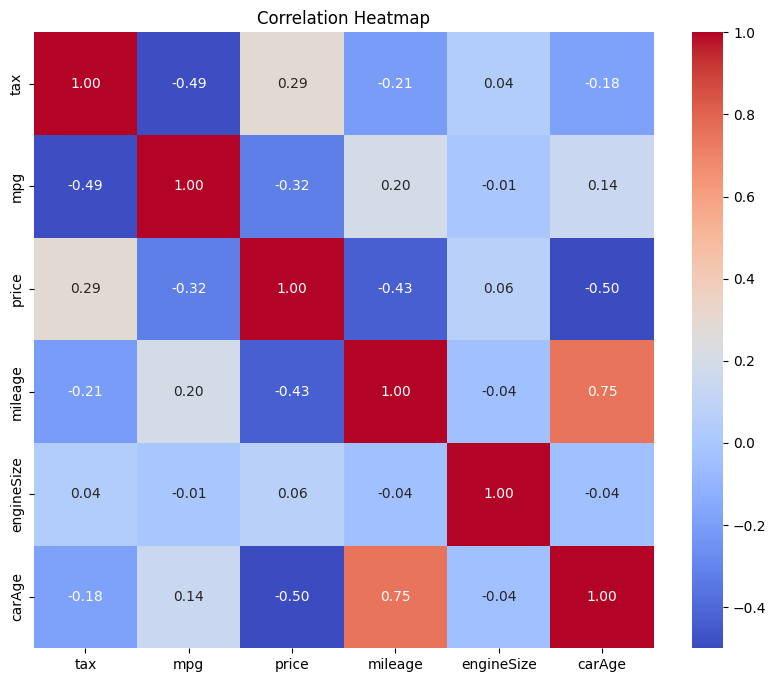

In [ ]:

import seaborn as sns
import matplotlib.pyplot as plt


# Select numerical columns for correlation
numerical_columns = ['tax', 'mpg', 'price', 'mileage', 'engineSize', 'carAge']

# Convert other columns to numeric if necessary, replacing 'Unknown' with 0
for column in numerical_columns:
    data[column] = pd.to_numeric(data[column].replace('Unknown', '0'), errors='coerce')

# Compute correlation matrix
correlation_matrix = data[numerical_columns].corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()


Positive correlations:

mileage and carAge (0.75): Older cars have higher mileage.

price and tax (0.29): Higher priced cars tend to have higher tax.

Negative correlations:

tax and mpg (-0.45): Higher tax is associated with lower miles per gallon.

price and mileage (-0.44): Higher prices are associated with lower mileage.

price and carAge (-0.50): Older cars tend to have lower prices.


In [ ]:
# Save the cleaned DataFrame to a CSV file
cleaned_file_path = '/content/drive/MyDrive/Colab Notebooks/dissertation/cleaned_Cars_data.csv'
data.to_csv(cleaned_file_path, index=False)

print(f"Cleaned data saved to {cleaned_file_path}")

Cleaned data saved to /content/drive/MyDrive/Colab Notebooks/dissertation/cleaned_Cars_data.csv


In [ ]:
#Loading the changed data from a specific CSV file into a pandas DataFrame.
data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/dissertation/cleaned_Cars_data.csv")

### EDA
Exploratory Data Analysis (EDA) can be divided into three key parts: Univariate, Bivariate, and Multivariate Exploration. Each focuses on analyzing data at different levels of complexity and interaction.

## 1. Univariate Exploration




In [ ]:

# Convert columns to numeric where applicable
data['price'] = pd.to_numeric(data['price'], errors='coerce')
data['mileage'] = pd.to_numeric(data['mileage'], errors='coerce')
data['engineSize'] = pd.to_numeric(data['engineSize'], errors='coerce')

# Handle missing values
data.fillna(0, inplace=True)

# Univariate Exploration

# Plot histograms for numerical features in subplots
num_features = ['price', 'mileage', 'engineSize', 'carAge', 'tax', 'mpg']

fig_num = make_subplots(rows=2, cols=3, subplot_titles=num_features)

for i, feature in enumerate(num_features):
    fig_num.add_trace(
        go.Histogram(x=data[feature], nbinsx=30, name=f'{feature} Distribution', opacity=0.75),
        row=i//3+1, col=i%3+1
    )

fig_num.update_layout(
    title_text='Numerical Features Distribution',
    template='plotly',
    showlegend=False
)

fig_num.show()

# Plot bar charts for categorical features in subplots
cat_features = ['transmission', 'fuelType', 'brand']

fig_cat = make_subplots(rows=1, cols=3, subplot_titles=cat_features)

for i, feature in enumerate(cat_features):
    count = data[feature].value_counts()
    fig_cat.add_trace(
        go.Bar(x=count.index, y=count.values, name=f'{feature} Distribution'),
        row=1, col=i+1
    )

fig_cat.update_layout(
    title_text='Categorical Features Distribution',
    template='plotly',
    showlegend=False
)

fig_cat.show()


# Observations
Distribution of Price: The price of cars is heavily skewed towards lower values, with most cars priced below 20,000.

Distribution of Mileage: Mileage shows a right-skewed distribution, indicating that the majority of cars have lower mileage, with a gradual decrease in frequency as mileage increases.

Distribution of Car Age: The car age distribution is sharply peaked, with most cars being relatively new (under 10 years old), and a small number of older cars causing a long right tail.

Distribution of Engine Size:The histogram for engine size shows distinct peaks at specific values, particularly around 1.0, 1.5, 2.0, and 2.5 liters, indicating that these engine sizes are the most common in the dataset. There are fewer cars with engine sizes above 3.0 liters, and the distribution is right-skewed with a long tail extending towards larger engine sizes. This suggests a preference for smaller engines in the dataset.

Distribution of Tax: The tax distribution shows clustering around common tax values, particularly near zero and around 150, indicating many cars fall within these tax brackets.

Distribution of MPG: The miles per gallon (mpg) distribution is concentrated around 50 to 100, with a sharp peak, suggesting that most cars have fuel efficiency within this range.

## 2. Bivariate Exploration
Bivariate exploration looks at the relationship between two variables. This can help identify correlations and patterns.



In [ ]:



# Convert columns to numeric where applicable
data['price'] = pd.to_numeric(data['price'], errors='coerce')
data['mileage'] = pd.to_numeric(data['mileage'], errors='coerce')
data['engineSize'] = pd.to_numeric(data['engineSize'], errors='coerce')

# Handle missing values
data.fillna(0, inplace=True)

# Bivariate Exploration

# Scatter plots for numerical features against price in subplots
num_features = ['mileage', 'engineSize', 'carAge', 'tax', 'mpg']

fig_scatter = make_subplots(rows=2, cols=3, subplot_titles=[f'{feature} vs. Price' for feature in num_features])

for i, feature in enumerate(num_features):
    fig_scatter.add_trace(
        go.Scatter(x=data[feature], y=data['price'], mode='markers', name=feature),
        row=i//3+1, col=i%3+1
    )

fig_scatter.update_layout(
    title_text='Scatter Plots: Numerical Features vs. Price',
    template='plotly',
    showlegend=False
)

# Hide the last subplot if there are fewer features than subplots
if len(num_features) < (2*3):
    fig_scatter.update_xaxes(visible=False, row=2, col=3)
    fig_scatter.update_yaxes(visible=False, row=2, col=3)

fig_scatter.show()

# Box plots for categorical features against price in subplots
cat_features = ['transmission', 'fuelType', 'brand']

fig_box = make_subplots(rows=1, cols=3, subplot_titles=[f'Price by {feature}' for feature in cat_features])

for i, feature in enumerate(cat_features):
    fig_box.add_trace(
        go.Box(y=data['price'], x=data[feature], name=feature),
        row=1, col=i+1
    )

fig_box.update_layout(
    title_text='Box Plots: Price by Categorical Features',
    template='plotly',
    showlegend=False
)

fig_box.show()


Interpretation of each scatter plot:

1. Mileage vs. Price: There's a strong negative correlation between mileage and price, meaning cars with higher mileage generally have lower prices.

2. Engine Size vs. Price: The relationship between engine size and price is less clear, with a wider spread of data points. There seems to be a slight positive correlation, but with many exceptions.

3. Car Age vs. Price: Similar to mileage, there's a clear negative correlation between car age and price, indicating that older cars tend to be less expensive.



4. Tax vs. Price: There's a weak positive correlation between tax and price, meaning cars with higher tax tend to have slightly higher prices, but with many exceptions.

5. mpg vs. Price: There's a moderate negative correlation between mpg and price, indicating that cars with higher fuel efficiency generally have lower prices, although the relationship is not as strong as in some other cases.

Based on the box plots,interpretations:

1. Price by Transmission: Manual transmissions tend to have lower median and overall price range compared to other transmission types, especially automatic and semi-auto, which have higher price points and wider distributions. This suggests that manual transmissions are generally more budget-friendly options.

2. Price by Fuel Type: Electric vehicles have the highest median price and a wide price range, indicating premium pricing. Petrol and diesel have similar median prices but differ in distribution, with diesel showing more variability. Hybrids offer a mid-range option in terms of price.

3. Price by Brand: Brand significantly impacts price. Luxury brands like BMW and Audi have higher median prices and wider ranges, while more affordable brands like Skoda and Hyundai are clustered at lower price points. This suggests that brand reputation and perceived value strongly influence pricing.

## 3. Multivariate Exploration
Multivariate exploration examines interactions among three or more variables, often using color, size, or other dimensions.

In [ ]:

# Convert relevant columns to numeric
data['price'] = pd.to_numeric(data['price'], errors='coerce')
data['mileage'] = pd.to_numeric(data['mileage'], errors='coerce')
data['engineSize'] = pd.to_numeric(data['engineSize'], errors='coerce')
data['carAge'] = pd.to_numeric(data['carAge'], errors='coerce')

# Handle missing values
data.fillna(0, inplace=True)

# Select only numeric columns for correlation
numeric_data = data.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix
correlation_matrix = numeric_data.corr()

# Create an annotated heatmap
fig = ff.create_annotated_heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns.tolist(),
    y=correlation_matrix.index.tolist(),
    annotation_text=correlation_matrix.round(2).values,
    colorscale='Viridis',
    zmin=-1,
    zmax=1
)

fig.update_layout(
    title="Annotated Correlation Matrix Heatmap",
    xaxis_title="Features",
    yaxis_title="Features"
)

fig.show()


The correlation heatmap indicates a strong negative correlation between carAge and year, suggesting that as a car's age increases, the year decreases, as expected. Additionally, carAge and mileage show a positive correlation, implying that older cars tend to have higher mileage.

In [ ]:




# Convert relevant columns to numeric
data['price'] = pd.to_numeric(data['price'], errors='coerce')
data['mileage'] = pd.to_numeric(data['mileage'], errors='coerce')
data['engineSize'] = pd.to_numeric(data['engineSize'], errors='coerce')
data['carAge'] = pd.to_numeric(data['carAge'], errors='coerce')

# Handle missing values
data.fillna(0, inplace=True)

# Select only numeric columns for correlation
numeric_data = data.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix
correlation_matrix = numeric_data.corr()

# Create a network graph
G = nx.Graph()

# Add nodes
for col in correlation_matrix.columns:
    G.add_node(col)

# Add edges
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > 0.5:  # Threshold for strong correlations
            G.add_edge(correlation_matrix.columns[i], correlation_matrix.columns[j],
                       weight=correlation_matrix.iloc[i, j])

# Plot the graph
pos = nx.spring_layout(G, seed=42)
edge_trace = []

for edge in G.edges(data=True):
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    weight = edge[2]['weight']
    edge_trace.append(go.Scatter(x=[x0, x1, None], y=[y0, y1, None],
                                 line=dict(width=2 * abs(weight), color='blue' if weight > 0 else 'red'),
                                 hoverinfo='none', mode='lines'))

node_trace = go.Scatter(x=[], y=[], text=[], mode='markers+text', hoverinfo='text', marker=dict(size=10, color='green'))

for node in G.nodes():
    x, y = pos[node]
    node_trace['x'] += (x,)
    node_trace['y'] += (y,)
    node_trace['text'] += (node,)

fig = go.Figure(data=edge_trace + [node_trace],
                layout=go.Layout(title='Correlation Network Graph', showlegend=False, hovermode='closest'))

fig.show()


Insights from the Graph:

Car Age and Mileage: There is a strong positive correlation (indicated by a blue line) between carAge and mileage. This suggests that as the age of the car increases, the mileage tends to increase as well.

Car Age and Year: There is a strong negative correlation (indicated by a red line) between carAge and year. This is expected because newer cars have a lower carAge.

Year and Mileage Negative Correlation: The red line suggests that as the year increases (i.e., the car is newer), the mileage tends to decrease. This makes intuitive sense because newer cars generally have lower mileage compared to older cars, assuming they have been driven for fewer years.

Potential Impact: This negative correlation between year and mileage might be important when considering predicting price, as newer cars with lower mileage might retain more value.

Other Features: The positions of other features like engineSize, mpg, tax, and price indicate they might not have strong correlations with each other or the features connected by the lines. They are isolated with no significant edges connecting them.

Overall, this graph is useful for quickly identifying which pairs of features are strongly correlated, which can inform further analysis or feature selection in predictive modeling.

In [ ]:
# Convert relevant columns to numeric
data['price'] = pd.to_numeric(data['price'], errors='coerce')
data['mileage'] = pd.to_numeric(data['mileage'], errors='coerce')
data['engineSize'] = pd.to_numeric(data['engineSize'], errors='coerce')
data['carAge'] = pd.to_numeric(data['carAge'], errors='coerce')

# Handle missing values
data.fillna(0, inplace=True)

# Create a scatter matrix plot
fig = px.scatter_matrix(data,
                        dimensions=['price', 'mileage', 'engineSize', 'carAge'],
                        color='fuelType')

fig.update_layout(
    title="Scatter Matrix",
    width=800,
    height=800
)

fig.show()


The scatter matrix illustrates the relationships between price, mileage, engineSize, and carAge across different fuelType categories. Notable trends include a decrease in price with increasing mileage and carAge, suggesting older and more driven cars are typically cheaper. The diagonal plots confirm expected linear relationships, such as between mileage and carAge, while the color coding shows that fuel type distribution is consistent across these variables, with petrol and diesel being the most common.

In [ ]:
data['brand_label'] = data['brand'].astype('category').cat.codes
data['model_label'] = data['model'].astype('category').cat.codes
data['fuelType_label'] = data['fuelType'].astype('category').cat.codes
data['transmission_label'] = data['transmission'].astype('category').cat.codes
#'cat.codes' gives you the numeric values that represent each category in a pandas Series with categorical data.

In [ ]:
#Gives the head of the data
data.head()

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,brand,carAge,brand_label,model_label,fuelType_label,transmission_label
0,I20,2017,7999.0,Manual,17307.0,Petrol,145.0,58.9,1.2,Hyundi,7.0,5,82,4,1
1,Tucson,2016,14499.0,Automatic,25233.0,Diesel,145.0,43.5,2.0,Hyundi,8.0,5,164,0,0
2,Tucson,2016,11399.0,Manual,37877.0,Diesel,145.0,61.7,1.7,Hyundi,8.0,5,164,0,1
3,I10,2016,6499.0,Manual,23789.0,Petrol,145.0,60.1,1.0,Hyundi,8.0,5,81,4,1
4,IX35,2015,10199.0,Manual,33177.0,Diesel,145.0,51.4,2.0,Hyundi,9.0,5,88,0,1


In [ ]:
# Handle outliers function
def remove_outliers(data, columns):
    for column in columns:
        q1 = data[column].quantile(0.25)
        q3 = data[column].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        data = data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]
    return data

# Define feature columns and target variable
feature_cols = ['mileage', 'engineSize', 'carAge', 'tax', 'mpg',
                'brand_label', 'model_label', 'fuelType_label', 'transmission_label']
target_col = 'price'

# Remove outliers
data = remove_outliers(data, feature_cols + [target_col])

In [ ]:
# Split data into training and test sets
X = data[feature_cols]
y = data[target_col]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardization of features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Define models and hyperparameters for tuning
models = {
    'Linear Regression': {
        'model': LinearRegression(),
        'param_grid': {}
    },
    'Decision Tree': {
        'model': DecisionTreeRegressor(random_state=42),
        'param_grid': {
            'max_depth': [None, 10, 20, 30],
            'min_samples_split': [2, 5, 10]
        }
    },
    'Random Forest': {
        'model': RandomForestRegressor(random_state=42),
        'param_grid': {
            'n_estimators': [50, 100, 200],
            'max_depth': [None, 10, 20, 30],
            'min_samples_split': [2, 5, 10]
        }
    },
    'Gradient Boosting': {
        'model': GradientBoostingRegressor(random_state=42),
        'param_grid': {
            'n_estimators': [50, 100, 200],
            'learning_rate': [0.01, 0.1, 0.2],
            'max_depth': [3, 5, 7]
        }
    },
    'Neural Network': {
        'model': MLPRegressor(random_state=42, max_iter=500),
        'param_grid': {
            'hidden_layer_sizes': [(50,)],
            'activation': ['relu'],
            'solver': ['adam'],
            'learning_rate': ['constant']
        }
    }
}

In [ ]:
# Train and evaluate models with cross-validation and hyperparameter tuning
for name, info in models.items():
    model = info['model']
    param_grid = info['param_grid']

    if param_grid:
        grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
        grid_search.fit(X_train_scaled, y_train)
        best_model = grid_search.best_estimator_
        print(f"Best {name} Parameters:", grid_search.best_params_)
    else:
        best_model = model
        best_model.fit(X_train_scaled, y_train)

    y_pred = best_model.predict(X_test_scaled)

    print(f"{name} Results:")
    print(f"MAE: {mean_absolute_error(y_test, y_pred):.2f}")
    print(f"MSE: {mean_squared_error(y_test, y_pred):.2f}")
    print(f"RMSE: {np.sqrt(mean_squared_error(y_test, y_pred)):.2f}")
    print(f"R-squared: {r2_score(y_test, y_pred):.2f}")
    print("\n")


Utilized various machine learning models to predict car prices, with each model showing varying degrees of performance:

Linear Regression:
Performance: Moderate, with an R-squared of 0.56.
Conclusion: Linear regression struggled to capture complex relationships in the data, resulting in lower accuracy compared to tree-based models.

Decision Tree:
Performance: Strong, with an R-squared of 0.91.
Conclusion: The decision tree model performed well with a balance between model complexity and accuracy, particularly with tuned hyperparameters.


Random Forest:
Performance: Excellent, with an R-squared of 0.93.
Conclusion: Random Forest excelled in capturing data patterns, offering strong performance and robust predictions due to its ensemble nature.

Gradient Boosting:
Performance: Outstanding, with an R-squared of 0.94.
Conclusion: Gradient boosting delivered the best performance, effectively handling non-linear relationships and feature interactions in the data.

Neural Network:
Performance: Adequate, with an R-squared of 0.74.

Conclusion: Despite having more complex architecture, the neural network did not perform as well as tree-based models, likely due to convergence issues and sensitivity to data scaling.
Across all models, Gradient Boosting provided the most accurate predictions, while simpler models like Linear Regression underperformed. Random Forest and Decision Tree also showed strong predictive power, emphasizing the strength of ensemble and tree-based methods for this dataset.

In [ ]:
pip install shap


In [ ]:
import shap

# Assuming `best_model` is your trained model and `X_train_scaled`, `X_test_scaled`, and `X_test` are already defined

# Get the original column names (before scaling)
feature_names = X_test.columns  # Assuming X_test is your DataFrame with the original column names

# Create a SHAP KernelExplainer using a subset of the training data
explainer = shap.KernelExplainer(best_model.predict, X_train_scaled[:100])

# Calculate SHAP values for a subset of the test data
shap_values = explainer.shap_values(X_test_scaled[:100])

# Plot SHAP values with actual column names
shap.summary_plot(shap_values, X_test_scaled[:100], feature_names=feature_names)


In [ ]:
import pickle

# Assuming `best_model` is the trained model you want to save
with open('best_model.pkl', 'wb') as file:
    pickle.dump(best_model, file)


In [ ]:
!pip install gradio
